### The University of Melbourne, School of Computing and Information Systems
# COMP90086 Computer Vision, 2022 Semester 2

## Assignment 1

**Student Name:**    `QINGTAN SHEN`

**Student ID:**     `1130945`

This iPython notebook is a template which you should use for your Assignment 3 submission. This file should be submitted at the **Assignment 3: Code** link on the LMS, along with any images needed to run your code.

In addition to this file, you should submit a writren report explaining your results at the **Assignment 3: Report** link on the LMS. Please see the assignment specification for details on what must be included in the report for each question.

*Adding proper comments to your code is MANDATORY.*

### 1. Load images and compute correspondences


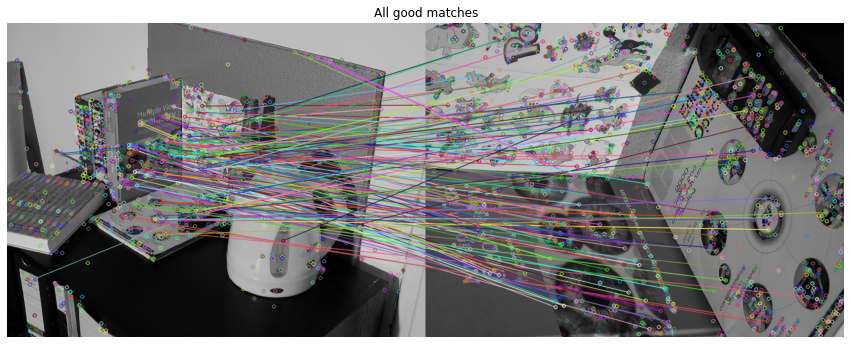

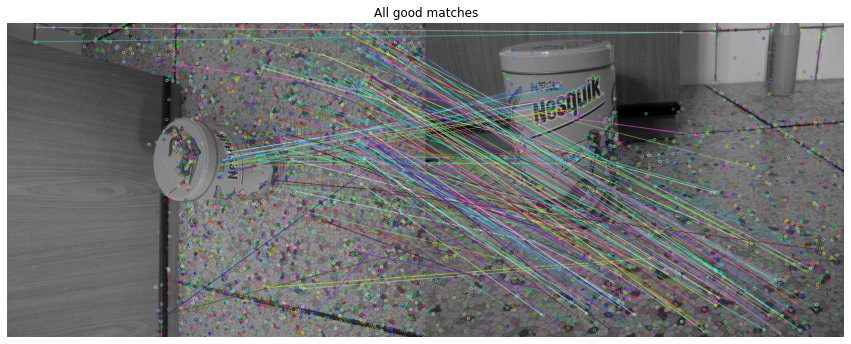

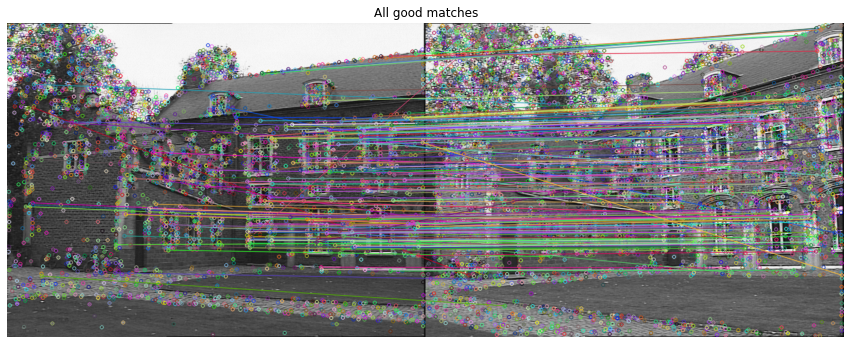

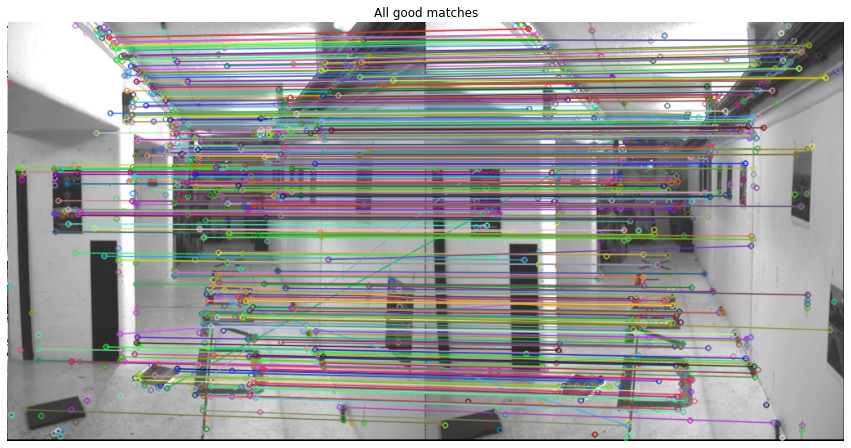

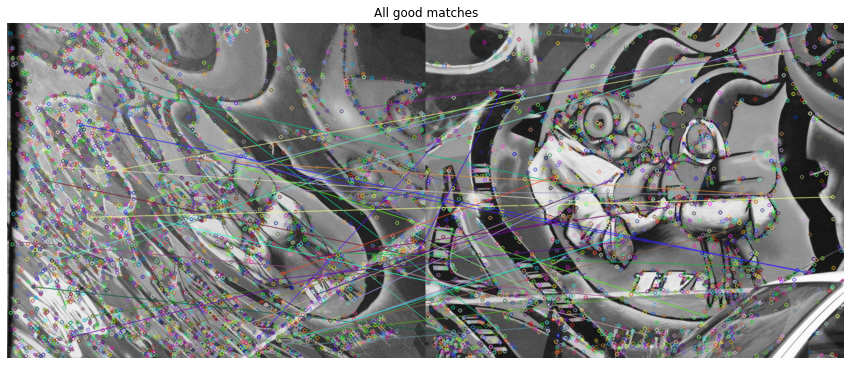

...

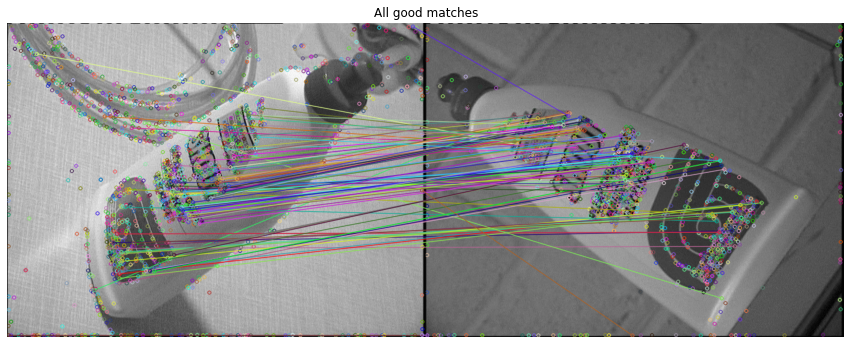

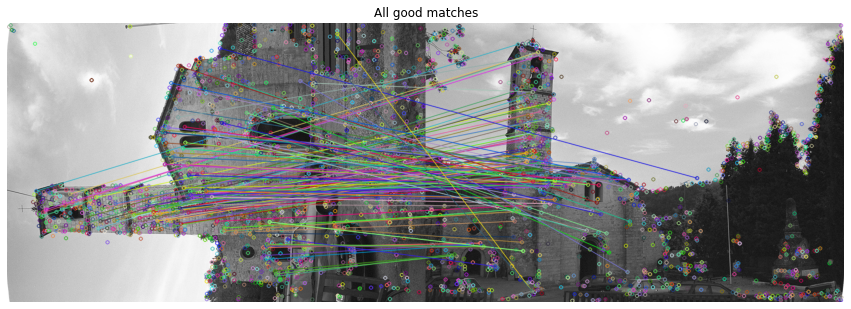

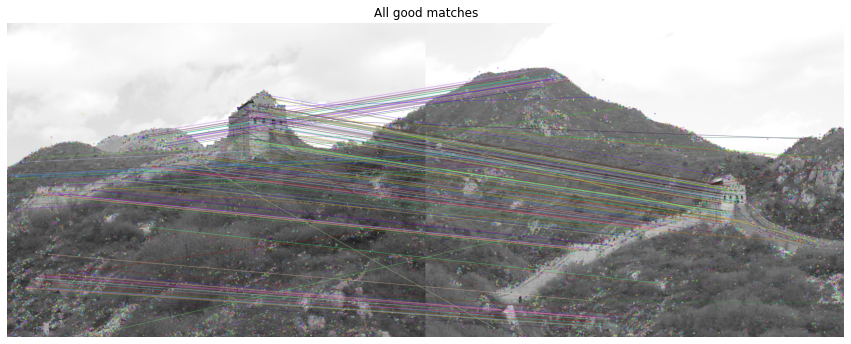

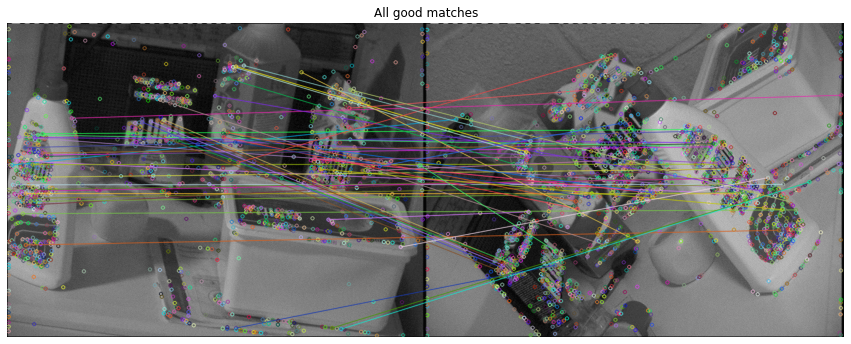

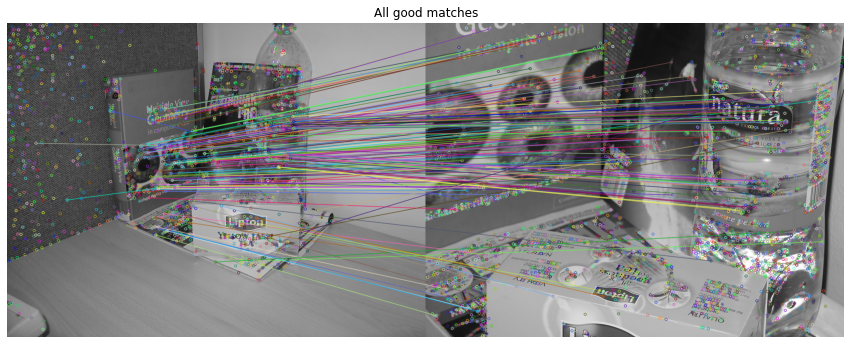

In [74]:
import os
import numpy as np
import cv2  
from matplotlib import pyplot as plt


rootpath = '/Users/apple/Desktop/COMP90086/kusvod2'
object_file = ['booksh','box','castle','corr','graff','head','kampa','Kyoto','leafs','plant','rotunda','shout',
              'valbonne','wall','wash','zoom']
file_format = ['png','png','png','png','png','jpg','png','jpg','jpg','png','png','png','png','jpg','png','png']
# store the first image of all the 16 plots
AllptsA = []
# store the second image of all the 16 plots
AllptsB = []
file_names = []
for i in range(len(object_file)):
    # input the plots
    pair_name = []
    pA = object_file[i] + 'A.' + file_format[i]
    pB = object_file[i] + 'B.' + file_format[i]
    pair_name.append(pA)
    pair_name.append(pB)
    file_names.append(pair_name)
    plotA = cv2.imread(os.path.join(rootpath, pA), cv2.IMREAD_GRAYSCALE)
    plotB = cv2.imread(os.path.join(rootpath, pB), cv2.IMREAD_GRAYSCALE)
    
    # get the keypoints
    sift = cv2.SIFT_create()
    kp1, des1 = sift.detectAndCompute(plotA, None)
    kp2, des2 = sift.detectAndCompute(plotB, None)
    
    # get the correspondences
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    matches = flann.knnMatch(des1, des2, k=2)
    ptsL, ptsR=[], []
    for i, (m,n) in enumerate(matches):
        if m.distance < 0.8*n.distance:
            ptsL.append(kp1[m.queryIdx].pt)
            ptsR.append(kp2[m.trainIdx].pt)
    
    # put the correspondences into the list
    AllptsA.append(ptsL)
    AllptsB.append(ptsR)
    
    # draw the keypoints and correspondences on their original graph
    matchesMask = []
    good = []
    for m, n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)
            matchesMask.append([1,0])
        else:
            matchesMask.append([0,0])
    
    draw_params = dict(matchesMask=matchesMask, flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
    good_matches = cv2.drawMatchesKnn(plotA, kp1, plotB, kp2, matches, None, **draw_params)
    plt.figure(figsize=(15, 15))

    plt.imshow(good_matches)
    plt.title('All good matches')
    plt.axis('off')

    plt.show()

### 2. Compute the Fundamental Matrix F using the 8 point algorithm

In [75]:
# step a
# shift and scale the pixel coordinates (center of mass)
def shift_and_scale_step(leftKps, rightKps):
    together = []
    # operate leftKps and rightKps respectively
    shiftL1, shiftL2 = shift_and_scale(leftKps)
    shiftR1, shiftR2 = shift_and_scale(rightKps)
    for i in range(len(shiftL1)):
        tog = []
        tog.append(shiftL1[i])
        tog.append(shiftL2[i])
        tog.append(shiftR1[i])
        tog.append(shiftR2[i])
        together.append(tog)
    # output an array with rows (left_x,left_y,right_x,right_y)
    together = np.array(together)
    return together

# Hartley's Normalized approach
def shift_and_scale(points):
    p_x = []
    p_y = []
    for i in points:
        p_x.append(i[0])
        p_y.append(i[1])
    p_x = np.array(p_x)
    p_y = np.array(p_y)
    mean_x = p_x.mean()
    mean_y = p_y.mean()
    n = len(p_x)
    s = np.sqrt((sum((p_x - mean_x)**2)+sum((p_y-mean_y)**2))/(2*n))
    new_px = (p_x - mean_x)/s
    new_py = (p_y - mean_y)/s
    return new_px, new_py

# step b
# compute the design matrix of 8 points
def random_create_design_matrix(together_array):
    # choose 8 points randomly
    length = len(together_array)
    all_indices = np.arange(length)
    np.random.shuffle(all_indices)
    sample_indices = all_indices[:8]
    test_indices = all_indices[8:]
    sample_points = together_array[sample_indices, :]
    test_points = together_array[test_indices, :]
    points_matrix = []
    for sample in sample_points:
        p1 = sample[0]
        p2 = sample[1]
        q1 = sample[2]
        q2 = sample[3]
        m1 = [p1*q1,p2*q1,q1,p1*q2,p2*q2,q2,p1,p2,1]
        points_matrix.append(m1)
    points_matrix = np.array(points_matrix)
    
    # step c
    # Perform an SVD of the design matrix to find its null space
    U, S, V = np.linalg.svd(points_matrix, full_matrices=True)
    # get the last line of V as draft fundamental matrix
    F1 = V[7]
    
    # step d
    # Compose the draft fundamental matrix F
    Fm = np.array([[F1[0],F1[1],F1[2]],[F1[3],F1[4],F1[5]],[F1[6],F1[7],F1[8]]])
    
    # step e
    # reassemble F matrix
    U1, S1, V1 = np.linalg.svd(Fm, full_matrices=True)
    # reassemble S1 only use its first two elements to form a matrix
    S1_m = np.array([[S1[0],0,0],[0,S1[1],0],[0,0,0]])
    F_final = np.dot(np.dot(U1, S1_m), V1)
    
    return F_final, test_points, sample_points

# step f
def get_distance(F_matrix, points):
    left = [] # three dimensional
    right = [] # only two dimensional, only x and y position
    for point in points:
        elementL = []
        elementR = []
        elementL.append(point[0])
        elementL.append(point[1])
        elementL.append(1)
        elementR.append(point[2])
        elementR.append(point[3])
        left.append(elementL)
        right.append(elementR)
    left = np.array(left)
    right = np.array(right)
    
    # F %*% left here
    lines = np.dot(F_matrix, left.T)
    lines = lines.T
    
    # get distance with the right point to the line
    distan_list = []
    for i in range(len(lines)):
        A = lines[i][0]
        B = lines[i][1]
        C = lines[i][2]
        right_x = right[i][0]
        right_y = right[i][1]
        distan = np.abs(A*right_x+B*right_y+C)/np.sqrt(A**2+B**2)
        distan_list.append(distan)
        
    return distan_list

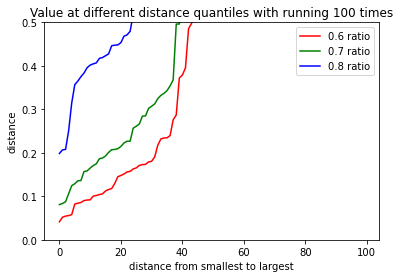

In [85]:
# main structure (use 0.06 distance value and 0.7 ratio value to determine the inlier)
min_dis = 10000
thres1 = []
thres2 = []
thres3 = []
m = points_list = shift_and_scale_step(AllptsA[0], AllptsB[0])
for i in range(100):
    F, test_points, sample_points = random_create_design_matrix(m)
    distance = get_distance(F, test_points)
    dis_len = len(distance)
    position1 = int(np.ceil(0.6*dis_len))
    position2 = int(np.ceil(0.7*dis_len))
    position3 = int(np.ceil(0.8*dis_len))
    sort_dis = np.sort(np.array(distance))
    thres1.append(sort_dis[position1])
    thres2.append(sort_dis[position2])
    thres3.append(sort_dis[position3])
sort_th1 = np.sort(np.array(thres1))
sort_th2 = np.sort(np.array(thres2))
sort_th3 = np.sort(np.array(thres3))
x1 = np.arange(100)
plt.plot(x1, sort_th1, 'red', label='0.6 ratio')
plt.plot(x1, sort_th2, 'green', label='0.7 ratio')
plt.plot(x1, sort_th3, 'blue', label='0.8 ratio')
plt.ylim(0, 0.5)
plt.legend()
plt.xlabel('distance from smallest to largest')
plt.ylabel('distance')
plt.title('Value at different distance quantiles with running 100 times')
plt.show()

In [77]:
F_list = []
sample_final_list = []
percentage_list = []
test_final_list = []
# step G
for i in range(len(AllptsA)):
    test_points_list = []
    sample_points_list = []
    F_final = 0
    ifFind = False
    percentage = -1
    m = points_list = shift_and_scale_step(AllptsA[i], AllptsB[i])
    for k in range(500):
        k_num = -1
        inlier_num = 0
        F, test_points, sample_points = random_create_design_matrix(m)
        sample_points_list.append(sample_points)
        test_points_list.append(test_points)
        distance = get_distance(F, test_points)
        dis_len = len(distance)
        for j in range(dis_len):
            if distance[j] <= 0.06:
                inlier_num += 1
                
        new_percentage = inlier_num/dis_len
        if new_percentage > percentage:
            percentage = new_percentage
            F_final = F
            k_num = k
        if new_percentage >= 0.7:
            ifFind = True
            print('The F for picture ', i, ' was found in the loop')
            F_list.append(F_final)
            percentage_list.append(percentage)
            test_final_list.append(test_points)
            sample_final_list.append(sample_points)
            break
    # if after 500 loops, we didn't find a inlier ratio greater than 0.7, we choose the F matrix with the largest ratio in this 500 loops
    if ifFind == False:
        F_list.append(F_final)
        percentage_list.append(percentage)
        test_final_list.append(test_points_list[k_num])
        sample_final_list.append(sample_points_list[k_num])

The F for picture  0  was found in the loop
The F for picture  1  was found in the loop
The F for picture  3  was found in the loop
The F for picture  12  was found in the loop


In [78]:
# get the percentage of inliers in all test points
for i in range(len(object_file)):
    print(object_file[i], ':', percentage_list[i])

booksh : 0.7183098591549296
box : 0.7146814404432132
castle : 0.5552763819095478
corr : 0.8951048951048951
graff : 0.09473684210526316
head : 0.6878172588832487
kampa : 0.5780141843971631
Kyoto : 0.41498047568335106
leafs : 0.12299465240641712
plant : 0.30945558739255014
rotunda : 0.3108108108108108
shout : 0.5641025641025641
valbonne : 0.7
wall : 0.41885964912280704
wash : 0.24
zoom : 0.4699248120300752


In [79]:
# get all the inliers for 16 pairs of images
inlier_list = []
for i in range(len(F_list)):
    inlier = []
    test_points = test_final_list[i]
    F_best = F_list[i]
    distance = get_distance(F_best, test_points)
    for j in range(len(distance)):
        if distance[j] <= 0.06:
            inlier.append(test_points[j].tolist())
    inlier_list.append(inlier)
    
# step H: Re-estimate F using all the inliers
F_final_list = []
for i in range(len(F_list)):
    points_matrix = []
    # the length of inlier_list[i] is all the inilier points, much greater than 8
    for sample in inlier_list[i]:
        p1 = sample[0]
        p2 = sample[1]
        q1 = sample[2]
        q2 = sample[3]
        m1 = [p1*q1,p2*q1,q1,p1*q2,p2*q2,q2,p1,p2,1]
        points_matrix.append(m1)
    points_matrix = np.array(points_matrix)
    
    U, S, V = np.linalg.svd(points_matrix, full_matrices=True)

    F1 = V[7]
    
    Fm = np.array([[F1[0],F1[1],F1[2]],[F1[3],F1[4],F1[5]],[F1[6],F1[7],F1[8]]])
    
    U1, S1, V1 = np.linalg.svd(Fm, full_matrices=True)

    S1_m = np.array([[S1[0],0,0],[0,S1[1],0],[0,0,0]])
    F_final = np.dot(np.dot(U1, S1_m), V1)
    F_final_list.append(F_final)

In [80]:
# check the inlier points number for each pairs of images:
for i in range(len(object_file)):
    print(object_file[i], ':', len(inlier_list[i]))

booksh : 153
box : 258
castle : 223
corr : 384
graff : 20
head : 274
kampa : 165
Kyoto : 1173
leafs : 49
plant : 116
rotunda : 24
shout : 134
valbonne : 140
wall : 197
wash : 41
zoom : 129


In [81]:
# function will be used in step i (undo the shift)
def undo_shift_F(allLeftKps, allRightKps, inlier_list, F):
    Lx, Ly, Rx, Ry = [], [], [], []
    # calculate the left original coordinate
    for i in allLeftKps:
        Lx.append(i[0])
        Ly.append(i[1])
    Lx = np.array(Lx)
    Ly = np.array(Ly)
    Lmean_x = Lx.mean()
    Lmean_y = Ly.mean()
    Ln = len(Lx)
    Ls = np.sqrt((sum((Lx - Lmean_x)**2)+sum((Ly-Lmean_y)**2))/(2*Ln))
    
    # calculate the left original coordinate
    for i in allRightKps:
        Rx.append(i[0])
        Ry.append(i[1])
    Rx = np.array(Rx)
    Ry = np.array(Ry)
    Rmean_x = Rx.mean()
    Rmean_y = Ry.mean()
    Rn = len(Rx)
    Rs = np.sqrt((sum((Rx - Rmean_x)**2)+sum((Ry-Rmean_y)**2))/(2*Rn))
    
    old_inlier_list = []
    for j in inlier_list:
        oldLx = j[0]*Ls + Lmean_x
        oldLy = j[1]*Ls + Lmean_y
        oldRx = j[2]*Rs + Rmean_x
        oldRy = j[3]*Rs + Rmean_y
        old_inlier_list.append([oldLx,oldLy,oldRx,oldRy])
    
    LT_matrix = np.array([[1/Ls,0,-Lmean_x/Ls],[0,1/Ls,-Lmean_y/Ls],[0,0,1]])
    RT_matrix = np.array([[1/Rs,0,-Rmean_x/Rs],[0,1/Rs,-Rmean_y/Rs],[0,0,1]])
    
    new_F = np.dot(np.dot(LT_matrix.T, F), RT_matrix)
    return new_F, old_inlier_list

In [82]:
# get the final F and inlier points list (step i)
F_result = []
final_test = []
for i in range(len(F_final_list)):
    f, old_inlier_list = undo_shift_F(AllptsA[i], AllptsB[i], inlier_list[i], F_final)
    F_result.append(f)
    final_test.append(old_inlier_list)
    
F_result

[array([[-4.09034628e-06,  3.01795982e-05, -1.18161929e-02],
        [-4.00878918e-05,  1.43290480e-07,  1.40660943e-02],
        [ 1.39875875e-02, -1.02921181e-02, -4.08639025e-01]]),
 array([[-1.90939943e-06,  1.40880267e-05, -8.89432942e-03],
        [-1.87132806e-05,  6.68888994e-08,  1.01088625e-02],
        [ 8.64887701e-03, -1.10465204e-02,  3.09275619e+00]]),
 array([[-2.51077239e-06,  1.85251068e-05, -6.59556701e-03],
        [-2.46071029e-05,  8.79558250e-08,  1.20113118e-02],
        [ 1.06921918e-02, -9.59080294e-03, -1.18414225e+00]]),
 array([[-4.76183766e-06,  3.51340295e-05, -9.90578910e-03],
        [-4.66689174e-05,  1.66813751e-07,  1.28391309e-02],
        [ 1.47599056e-02, -1.00226651e-02, -8.76379602e-01]]),
 array([[-1.87091300e-06,  1.38040642e-05, -6.67797592e-03],
        [-1.83360901e-05,  6.55406667e-08,  7.25418431e-03],
        [ 9.59453738e-03, -5.54453242e-03, -8.33245965e-01]]),
 array([[-6.82578005e-07,  5.03623129e-06, -2.85511873e-03],
        [-6.68

### 3. Randomly sample 10 correspondences and display images, corresponding points and epipolar lines

In [83]:
def drawlines(img1, img2, lines, pts1, pts2):
    r,c = img1.shape
    img1 = cv2.cvtColor(img1, cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2, cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines, pts1, pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1]])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1]])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color, 1)
        img1 = cv2.circle(img1, tuple(pt1), 5, color, -1)
        img2 = cv2.circle(img2, tuple(pt2), 5, color, -1)
    return img1, img2

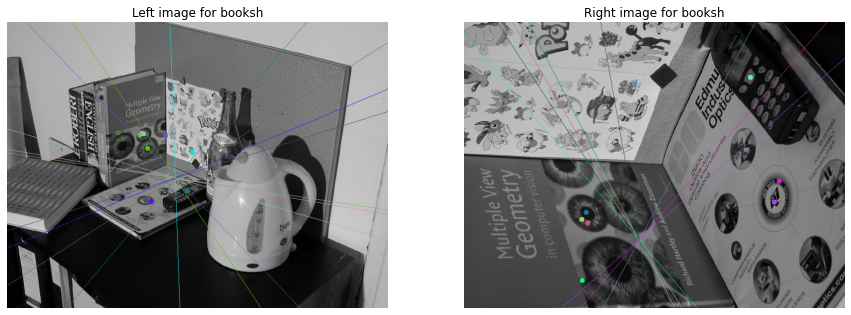

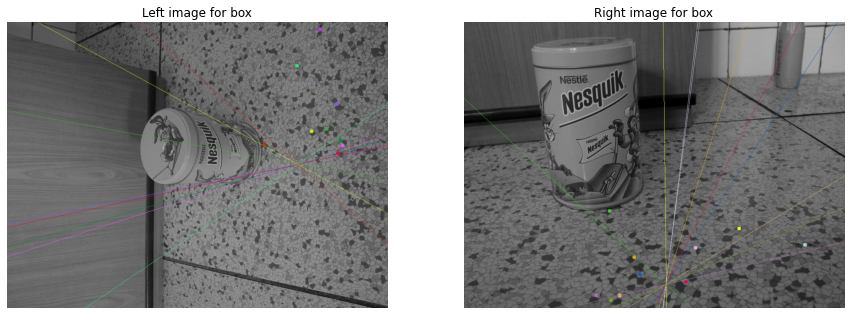

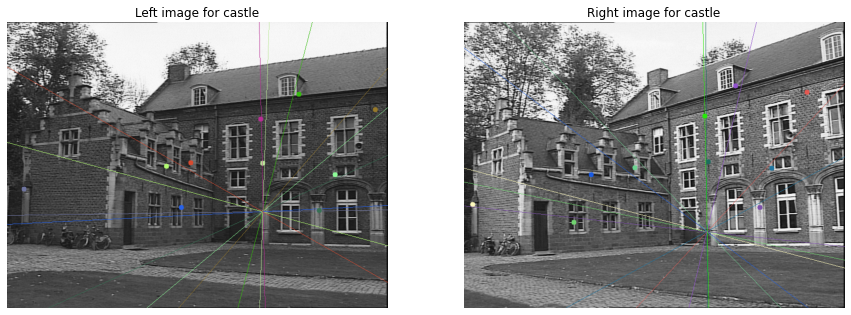

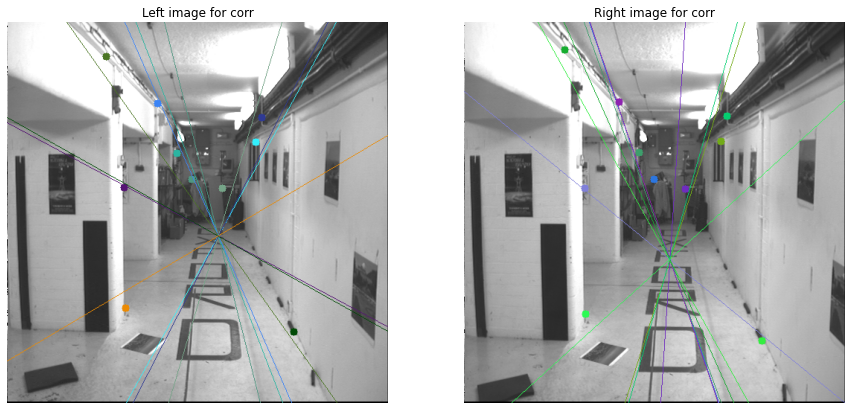

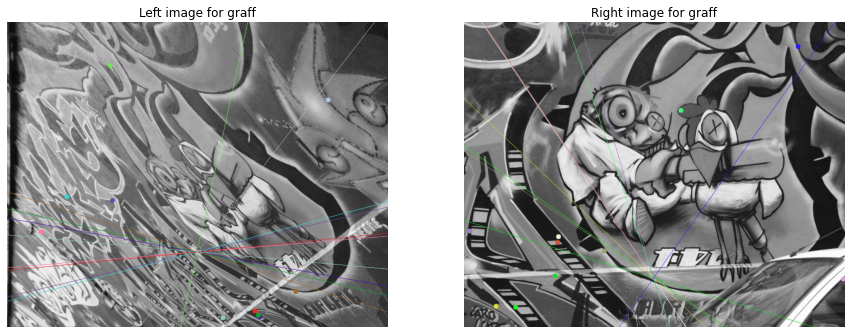

...

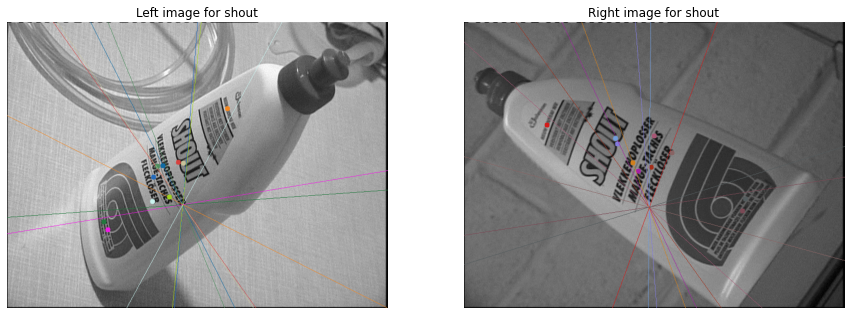

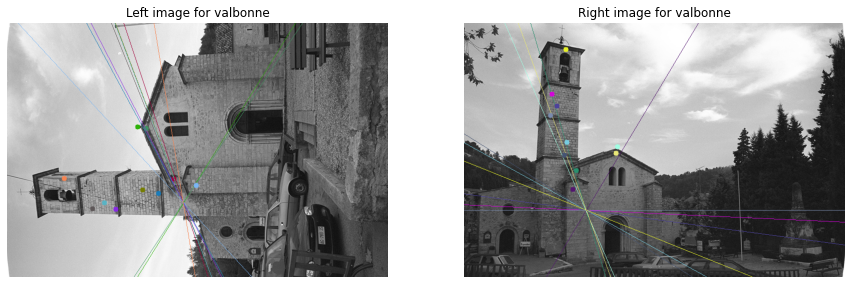

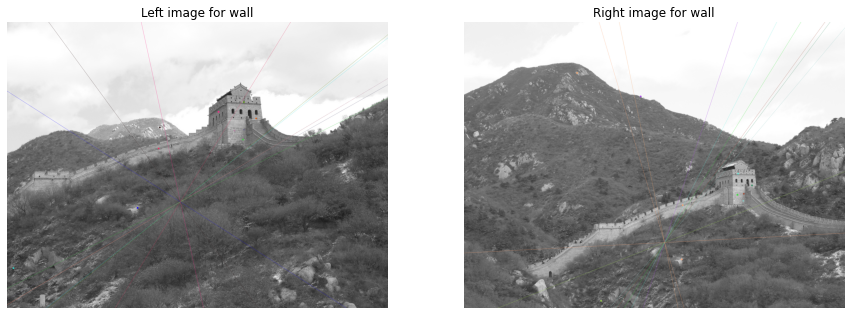

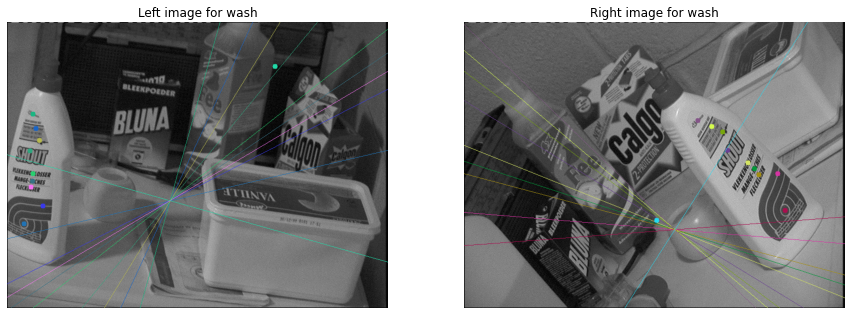

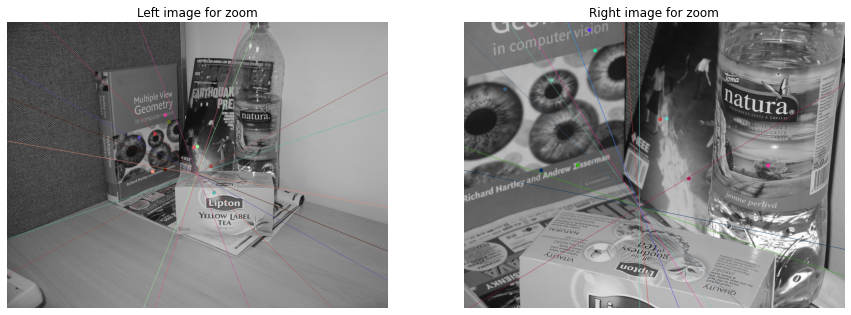

In [87]:
for j in range(len(F_result)):
    inlier_index = np.arange(len(final_test[j]))
    np.random.shuffle(inlier_index)
    choose_index = inlier_index[:10]
    old_inlier_arr = np.array(final_test[j])
    choose_points = old_inlier_arr[choose_index, :]
    # pts1 and pts2
    ptsL = []
    ptsR = []
    ptsL_p = []
    ptsR_p = []
    for i in choose_points:
        pts_L1 = []
        pts_R1 = []
        ptsL_p1 = []
        ptsR_p1 = []
        pts_L1.append(i[0])
        pts_L1.append(i[1])
        pts_L1.append(1)
        ptsL_p1.append(int(i[0]))
        ptsL_p1.append(int(i[1]))
        pts_R1.append(i[2])
        pts_R1.append(i[3])
        pts_R1.append(1)
        ptsR_p1.append(int(i[2]))
        ptsR_p1.append(int(i[3]))
        ptsL.append(pts_L1)
        ptsR.append(pts_R1)
        ptsL_p.append(ptsL_p1)
        ptsR_p.append(ptsR_p1)
    ptsL = np.array(ptsL)
    ptsR = np.array(ptsR)
    ptsL_p = np.array(ptsL_p)
    ptsR_p = np.array(ptsR_p)

    lineR = np.dot(F_result[j].T, ptsL.T).T
    lineL = np.dot(F_result[j], ptsR.T).T
    plotA = cv2.imread(os.path.join(rootpath, file_names[j][0]), cv2.IMREAD_GRAYSCALE)
    plotB = cv2.imread(os.path.join(rootpath, file_names[j][1]), cv2.IMREAD_GRAYSCALE)

    imgL, img1 = drawlines(plotA, plotB, lineL, ptsL_p, ptsR_p)
    imgR, img2 = drawlines(plotB, plotA, lineR, ptsR_p, ptsL_p)

    # Display the results
    plt.subplots(figsize=(15, 15)) 

    plt.subplot(1,2,1)
    plt.imshow(imgL, cmap='gray') 
    str1 = 'Left image for ' + object_file[j]
    plt.title(str1)
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(imgR, cmap='gray')  
    str2 = 'Right image for ' + object_file[j]
    plt.title(str2)
    plt.axis('off')

    plt.show()